In [1]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Subset
from transformers import ViTForImageClassification, ViTImageProcessor
from PIL import Image
from tqdm import tqdm

# Пути к данным
TRAIN_DATA_PATH = '/content/drive/MyDrive/no_bg/train_no_bg'
TEST_DATA_PATH = '/content/drive/MyDrive/no_bg/test_no_bg'

# Гиперпараметры
MODEL_NAME = 'google/vit-base-patch16-224-in21k'
BATCH_SIZE = 8
LEARNING_RATE = 1e-5
NUM_EPOCHS = 2
K_FOLDS = 3

# Устройство
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Процессор изображений и преобразования
processor = ViTImageProcessor.from_pretrained(MODEL_NAME)
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
])
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
])

# Класс для загрузки данных с путями
class CustomImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        image, label = super().__getitem__(index)
        path = self.imgs[index][0]  # Путь к изображению
        return image, label, path

# Датасеты
train_dataset = CustomImageFolderWithPaths(root=TRAIN_DATA_PATH, transform=train_transform)
test_dataset = CustomImageFolderWithPaths(root=TEST_DATA_PATH, transform=test_transform)

# Класс модели с поддержкой внимания
class ViTWithAttention(ViTForImageClassification):
    def forward(self, pixel_values, labels=None, output_attentions=False):
        outputs = super().forward(pixel_values=pixel_values, labels=labels)
        if output_attentions:
            attentions = outputs.attentions
            return outputs.logits, attentions
        else:
            return outputs.logits

# Инициализация модели
model = ViTWithAttention.from_pretrained(MODEL_NAME, output_attentions=True).to(DEVICE)

# Функция обучения с K-Fold Cross-Validation
def train_kfold(model, dataset, num_epochs=2, k_folds=3, batch_size=32, learning_rate=1e-5):
    """
    Обучение модели с K-Fold Cross-Validation.
    """
    kfold = KFold(n_splits=k_folds, shuffle=True, random_state=42)
    results = {}

    for fold, (train_idx, val_idx) in enumerate(kfold.split(dataset)):
        print(f"\n--- Fold {fold + 1}/{k_folds} ---")

        # Создание тренировочного и валидационного наборов
        train_subsampler = Subset(dataset, train_idx)
        val_subsampler = Subset(dataset, val_idx)

        train_loader = DataLoader(train_subsampler, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_subsampler, batch_size=batch_size, shuffle=False)

        # Инициализация оптимизатора и функции потерь
        optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
        criterion = torch.nn.CrossEntropyLoss()

        for epoch in range(num_epochs):
            print(f"Epoch {epoch + 1}/{num_epochs}")
            model.train()
            running_loss = 0.0
            correct = 0
            total = 0

            for inputs, labels, _ in tqdm(train_loader, desc="Training"):  # Игнорируем путь
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                optimizer.zero_grad()

                # Прогон через модель
                outputs = model(pixel_values=inputs, labels=labels)  # передаем labels, чтобы получить logits
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs  # Проверяем наличие logits
                loss = criterion(logits, labels)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()

                # Подсчёт точности
                _, predicted = torch.max(logits, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()

            epoch_loss = running_loss / len(train_loader)
            epoch_accuracy = 100 * correct / total
            print(f"Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%")

            # Оценка на валидационных данных
            val_loss, val_accuracy = evaluate_model(model, val_loader)
            print(f"Validation Loss: {val_loss:.4f}, Accuracy: {val_accuracy:.2f}%")

        # Сохраняем результаты для текущего фолда
        results[fold] = {'val_loss': val_loss, 'val_accuracy': val_accuracy}

    return results


# Функция оценки модели
def evaluate_model(model, dataloader):
    model.eval()
    correct, total, val_loss = 0, 0, 0.0
    criterion = torch.nn.CrossEntropyLoss()

    with torch.no_grad():
        for inputs, labels, _ in dataloader:  # Игнорируем путь
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            outputs = model(pixel_values=inputs, labels=labels)  # передаем labels, чтобы получить logits
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs  # Проверяем наличие logits
            loss = criterion(logits, labels)
            val_loss += loss.item()

            _, predicted = torch.max(logits, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(dataloader)
    accuracy = 100 * correct / total
    return avg_val_loss, accuracy


# Функция для визуализации масок внимания
def visualize_attention(image_path, model):
    model.eval()
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
    ])
    input_tensor = transform(image).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        outputs = model(pixel_values=input_tensor, output_attentions=True)
        attentions = outputs.attentions

    # Выбираем последнюю матрицу внимания
    last_attention = attentions[-1][0]  # Batch size = 1, выбираем первый элемент
    num_heads = last_attention.shape[0]

    # Среднее по всем головам внимания
    avg_attention = last_attention.mean(dim=0).cpu().numpy()

    # Визуализация
    plt.figure(figsize=(10, 10))
    plt.imshow(avg_attention, cmap='viridis')
    plt.title("Attention Map")
    plt.axis("off")
    plt.show()


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTWithAttention were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [2]:
# Обучение модели
results = train_kfold(model, train_dataset, NUM_EPOCHS, K_FOLDS, BATCH_SIZE, LEARNING_RATE)




--- Fold 1/3 ---
Epoch 1/2


Training: 100%|██████████| 298/298 [27:12<00:00,  5.48s/it]


Loss: 0.3949, Accuracy: 83.28%
Validation Loss: 0.2384, Accuracy: 93.03%
Epoch 2/2


Training: 100%|██████████| 298/298 [02:37<00:00,  1.89it/s]


Loss: 0.1814, Accuracy: 94.54%
Validation Loss: 0.2270, Accuracy: 91.43%

--- Fold 2/3 ---
Epoch 1/2


Training: 100%|██████████| 298/298 [02:34<00:00,  1.93it/s]


Loss: 0.1429, Accuracy: 95.50%
Validation Loss: 0.0849, Accuracy: 97.73%
Epoch 2/2


Training: 100%|██████████| 298/298 [02:34<00:00,  1.93it/s]


Loss: 0.1014, Accuracy: 96.93%
Validation Loss: 0.0683, Accuracy: 98.24%

--- Fold 3/3 ---
Epoch 1/2


Training: 100%|██████████| 298/298 [02:35<00:00,  1.92it/s]


Loss: 0.0842, Accuracy: 97.27%
Validation Loss: 0.0431, Accuracy: 99.33%
Epoch 2/2


Training: 100%|██████████| 298/298 [02:33<00:00,  1.94it/s]


Loss: 0.0545, Accuracy: 98.57%
Validation Loss: 0.0528, Accuracy: 98.40%


In [6]:
import os

# Указываем папку для сохранения модели
output_dir = "/content/drive/MyDrive/2_semestr"

# Создаем директорию, если она еще не создана
os.makedirs(output_dir, exist_ok=True)

# Сохраняем модель
model.save_pretrained(output_dir)

# Сохраняем процессор (ViTImageProcessor)
processor.save_pretrained(output_dir)

print(f"Model and processor saved to {output_dir}")


Model and processor saved to /content/drive/MyDrive/2_semestr


In [9]:
import pandas as pd

def predict_and_create_dataframe(model, dataloader, class_names):
    """
    Делает предсказания на данных и создает DataFrame с результатами.

    :param model: Обученная модель.
    :param dataloader: DataLoader для тестовых данных.
    :param class_names: Список имен классов.
    :return: DataFrame с именами файлов, предсказаниями и истинными значениями.
    """
    model.eval()
    predictions = []
    ground_truths = []
    file_names = []

    with torch.no_grad():
        for inputs, labels, paths in tqdm(dataloader, desc="Predicting"):
            inputs = inputs.to(DEVICE)
            labels = labels.to(DEVICE)

            # Получение предсказаний
            outputs = model(pixel_values=inputs)
            logits = outputs.logits if hasattr(outputs, 'logits') else outputs  # Проверяем наличие logits
            _, preds = torch.max(logits, 1)

            # Сохранение данных
            predictions.extend(preds.cpu().numpy())
            ground_truths.extend(labels.cpu().numpy())
            file_names.extend(paths)

    # Создание DataFrame
    df = pd.DataFrame({
        'File Name': file_names,
        'True Label': [class_names[label] for label in ground_truths],
        'Predicted Label': [class_names[pred] for pred in predictions]
    })

    return df


In [11]:
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
class_names = train_dataset.classes

# Получение предсказаний и создание DataFrame
df_results = predict_and_create_dataframe(model, test_loader, class_names)

# Просмотр первых строк DataFrame
print(df_results.head())

# Сохранение результатов
df_results.to_csv("predictions_results.csv", index=False)


Predicting: 100%|██████████| 112/112 [13:25<00:00,  7.20s/it]

                                           File Name True Label  \
0  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...          0   
1  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...          0   
2  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...          0   
3  /content/drive/MyDrive/no_bg/test_no_bg/0/028_...          0   
4  /content/drive/MyDrive/no_bg/test_no_bg/0/032_...          0   

  Predicted Label  
0               0  
1               0  
2               0  
3               0  
4               0  


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       646
           1       0.92      0.95      0.94       246

    accuracy                           0.96       892
   macro avg       0.95      0.96      0.96       892
weighted avg       0.96      0.96      0.96       892



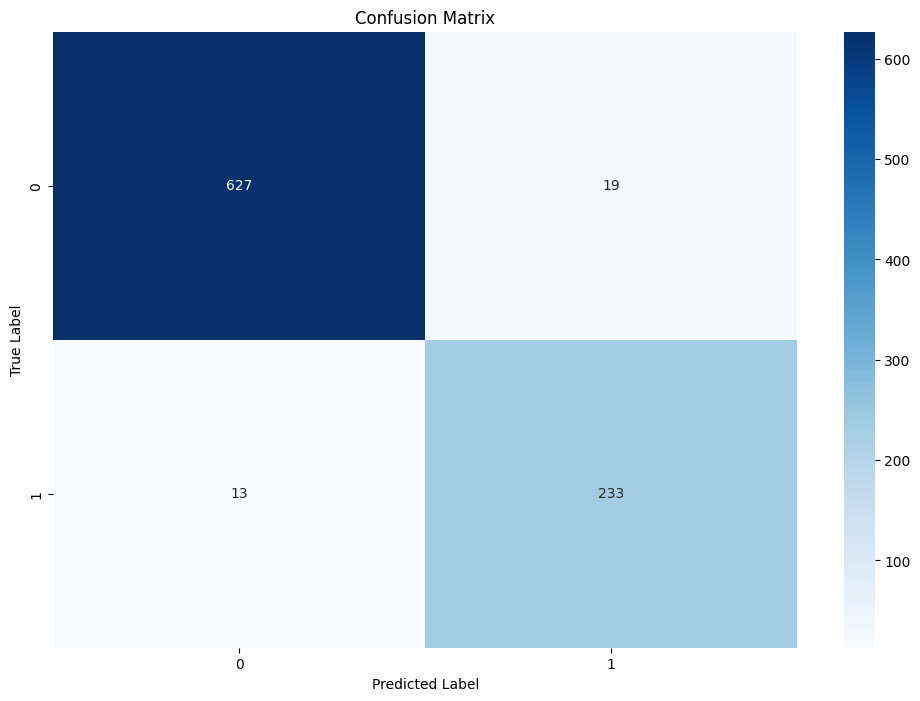

In [12]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Получение истинных и предсказанных значений из DataFrame
true_labels = df_results['True Label']
predicted_labels = df_results['Predicted Label']

# Классы
unique_classes = sorted(df_results['True Label'].unique())

# Метрики
print("Classification Report:")
print(classification_report(true_labels, predicted_labels, target_names=unique_classes))

# Матрица ошибок
conf_matrix = confusion_matrix(true_labels, predicted_labels, labels=unique_classes)

# Визуализация матрицы ошибок
plt.figure(figsize=(12, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_classes, yticklabels=unique_classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


True Label: 0, Predicted Label: 1


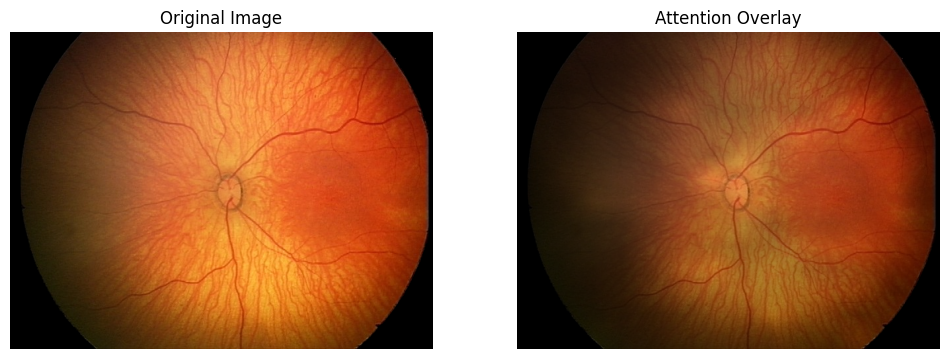

True Label: 0, Predicted Label: 1


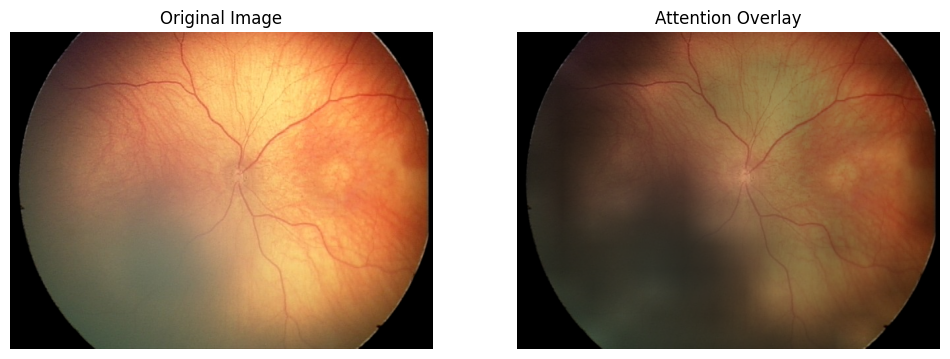

True Label: 0, Predicted Label: 1


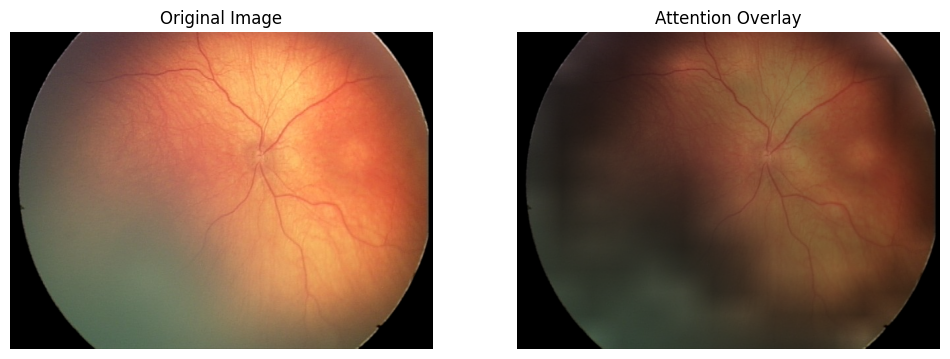

True Label: 0, Predicted Label: 1


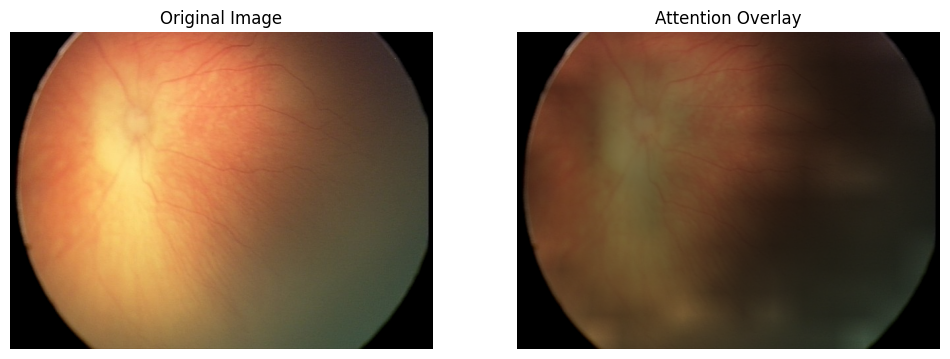

True Label: 0, Predicted Label: 1


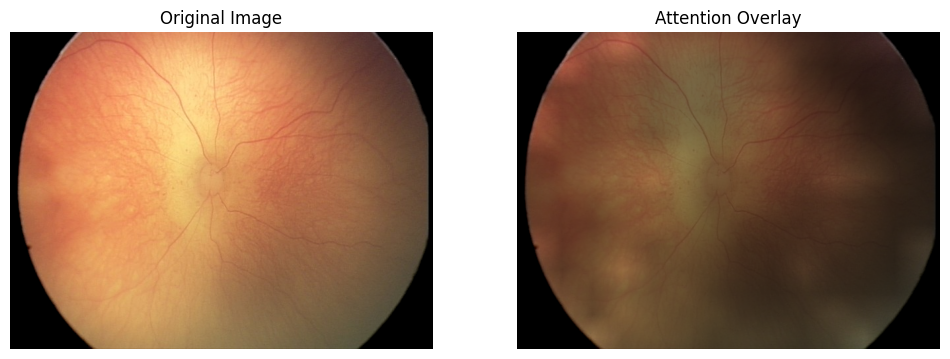

True Label: 0, Predicted Label: 1


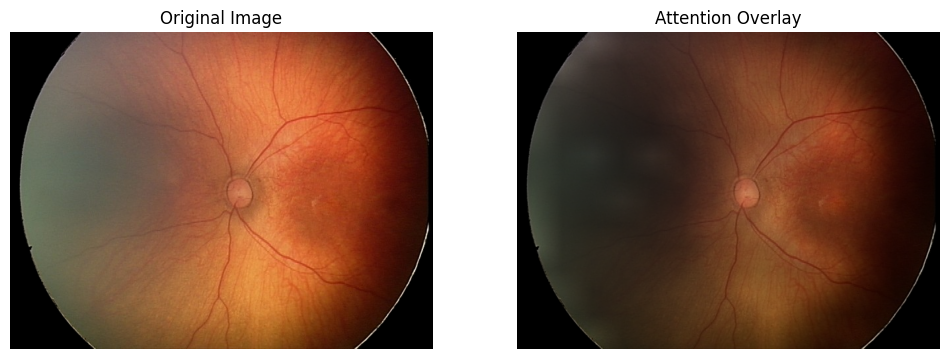

True Label: 0, Predicted Label: 1


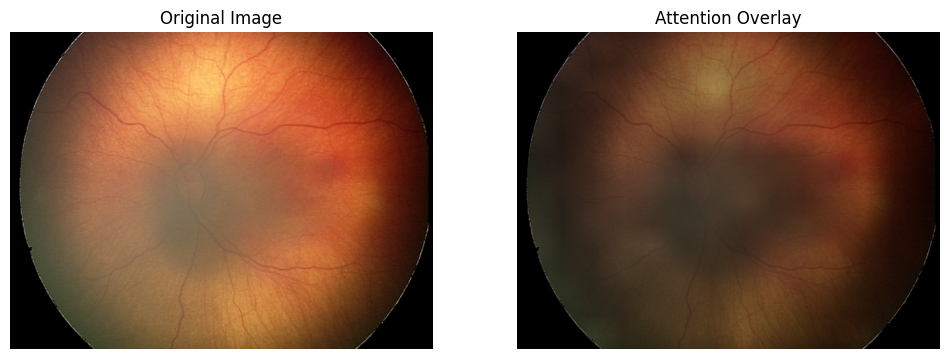

True Label: 0, Predicted Label: 1


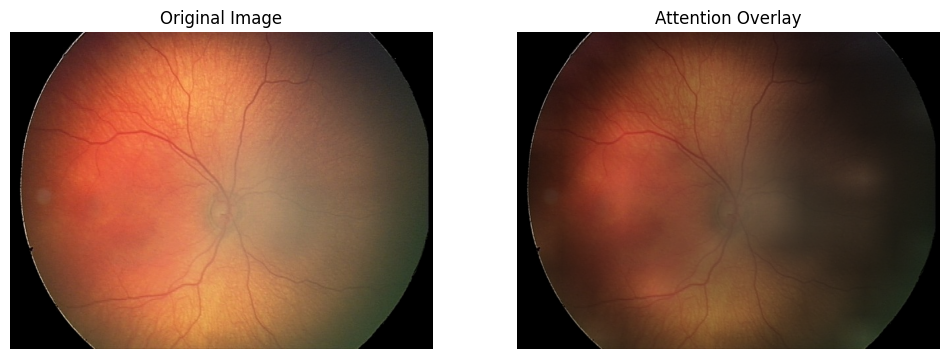

True Label: 0, Predicted Label: 1


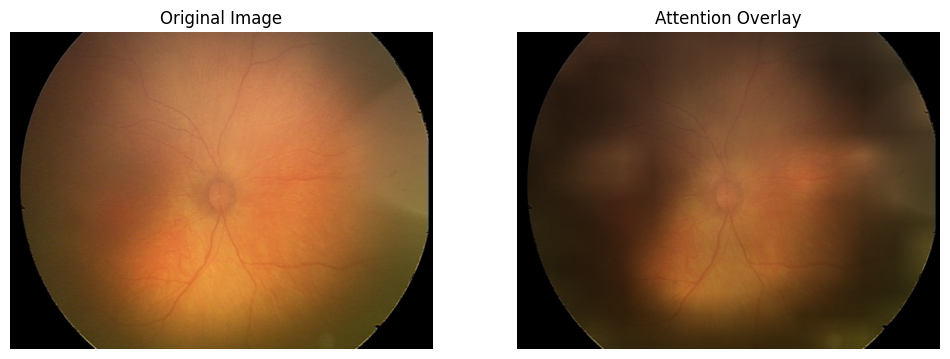

True Label: 0, Predicted Label: 1


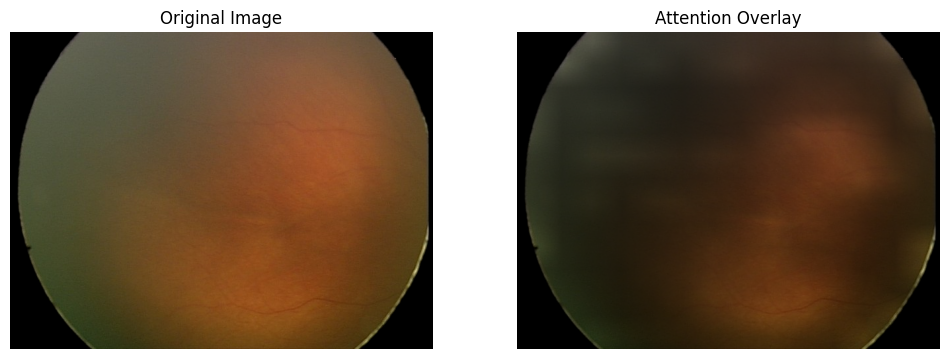

True Label: 0, Predicted Label: 1


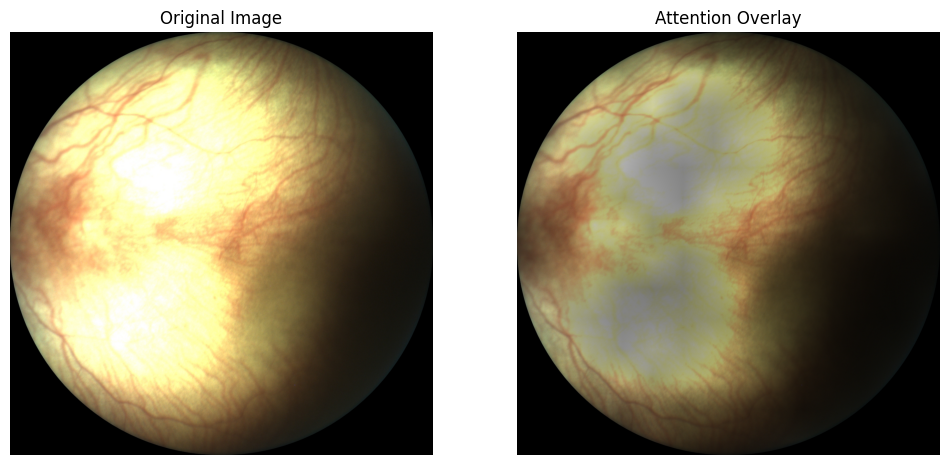

True Label: 0, Predicted Label: 1


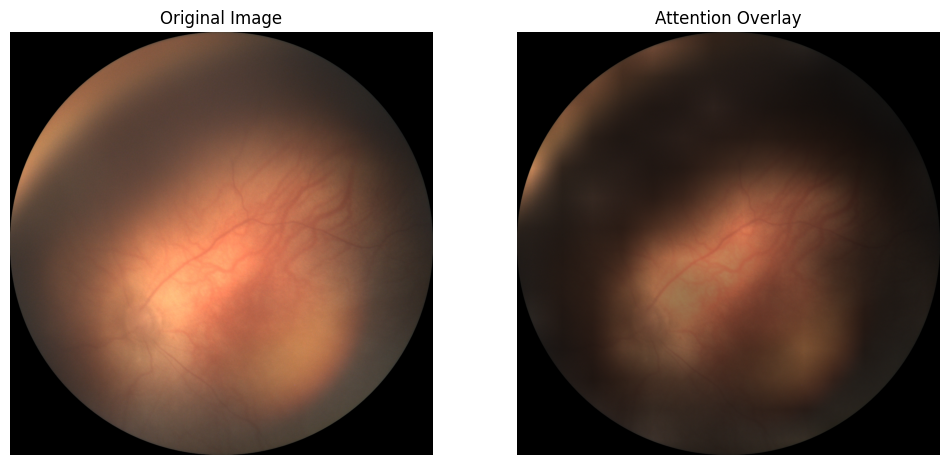

True Label: 0, Predicted Label: 1


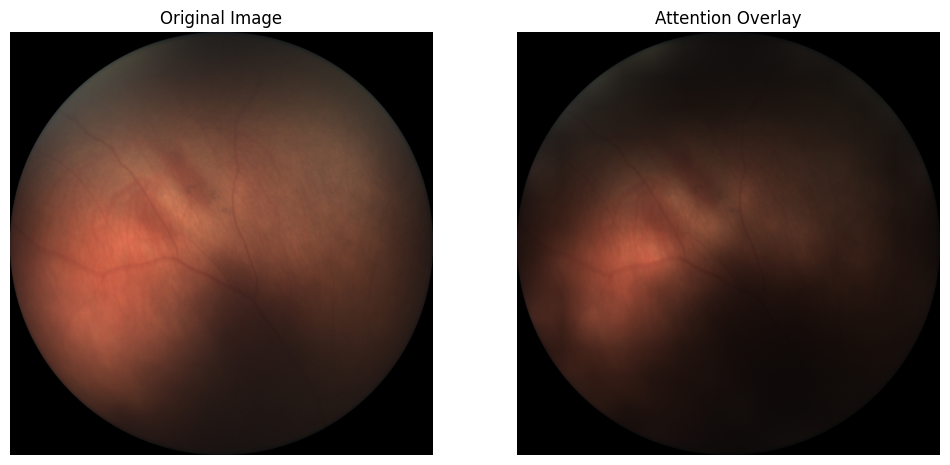

True Label: 0, Predicted Label: 1


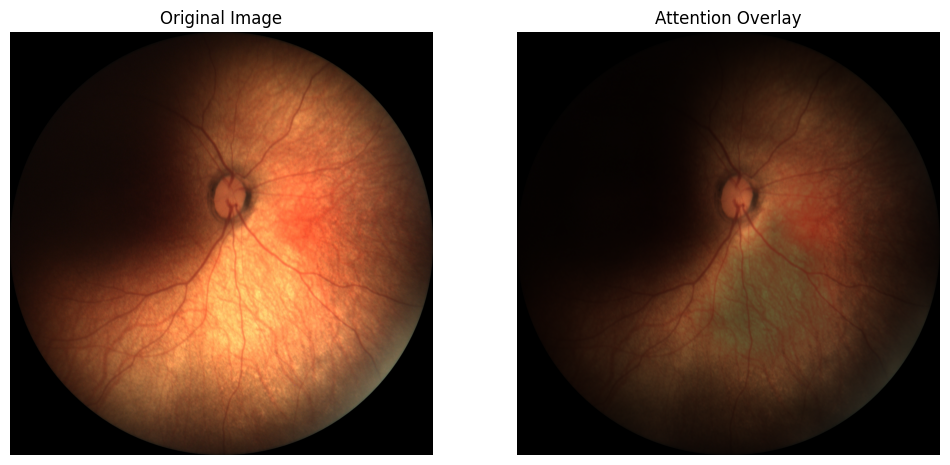

True Label: 0, Predicted Label: 1


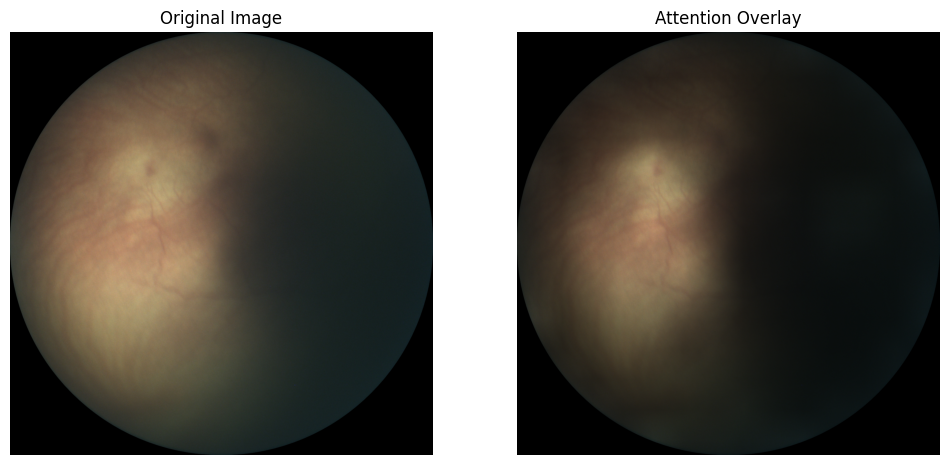

True Label: 0, Predicted Label: 1


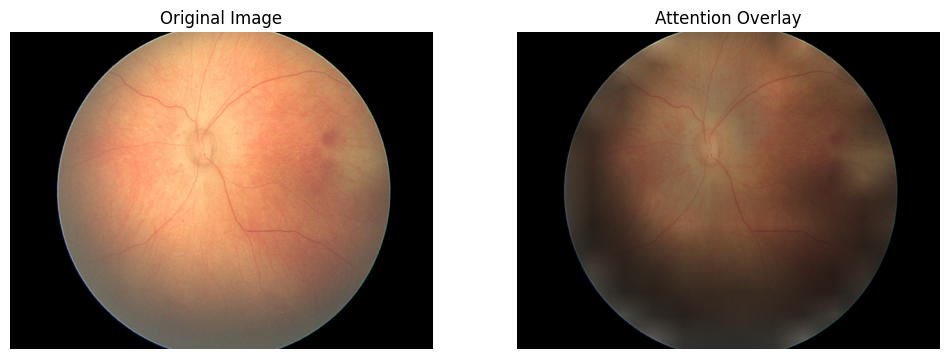

True Label: 0, Predicted Label: 1


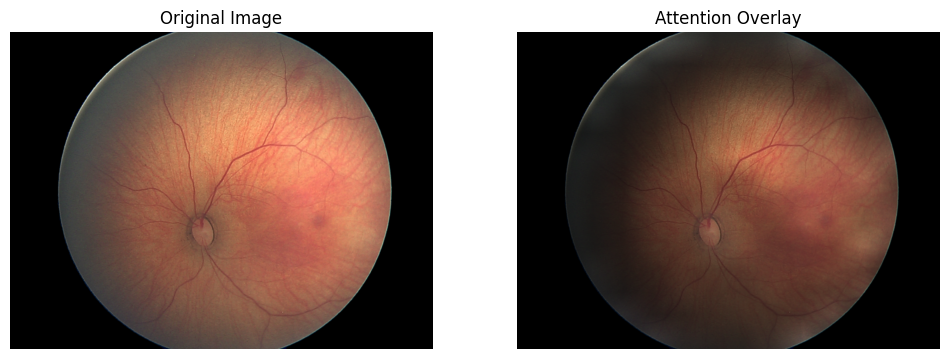

True Label: 0, Predicted Label: 1


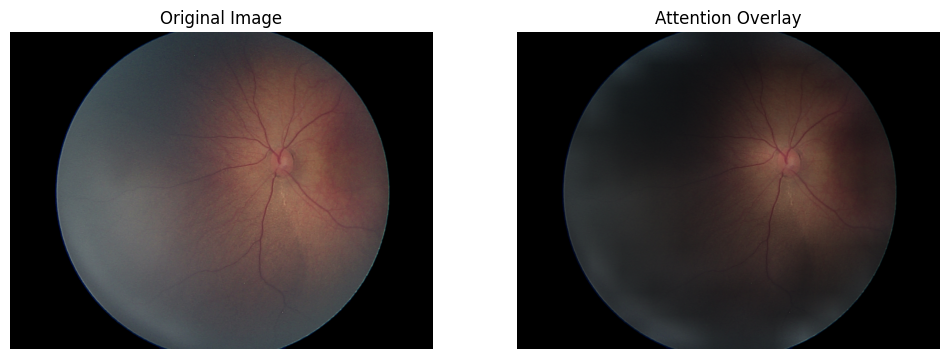

True Label: 0, Predicted Label: 1


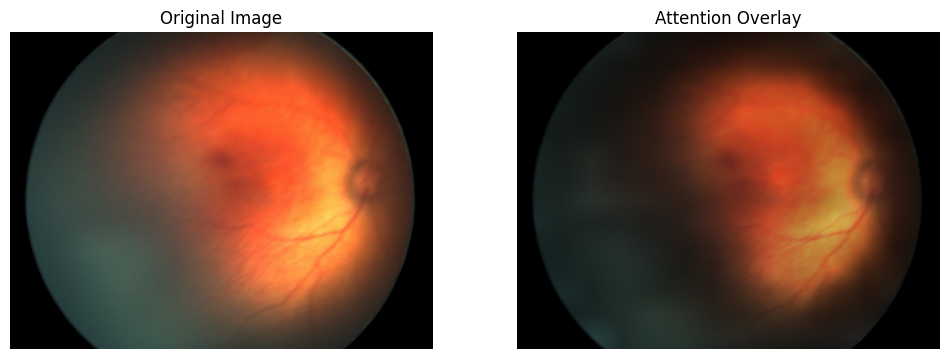

True Label: 1, Predicted Label: 0


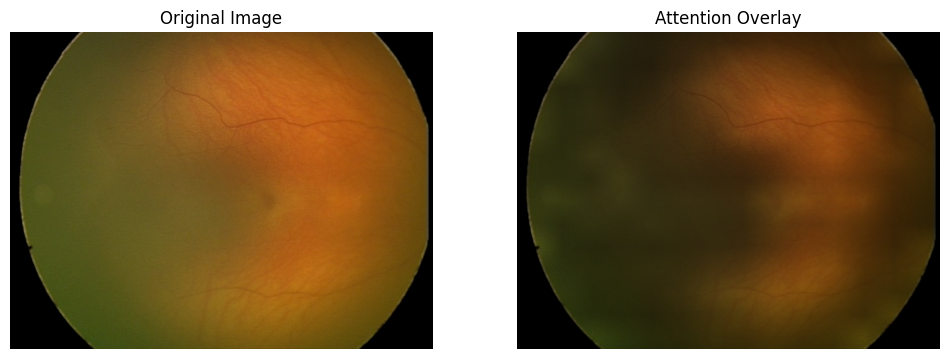

True Label: 1, Predicted Label: 0


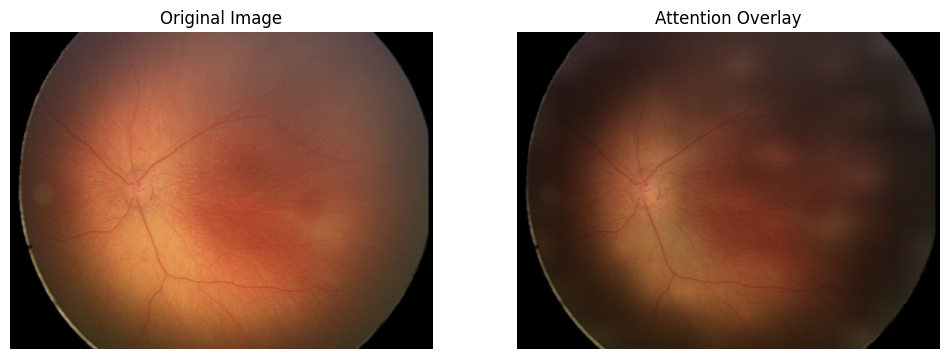

True Label: 1, Predicted Label: 0


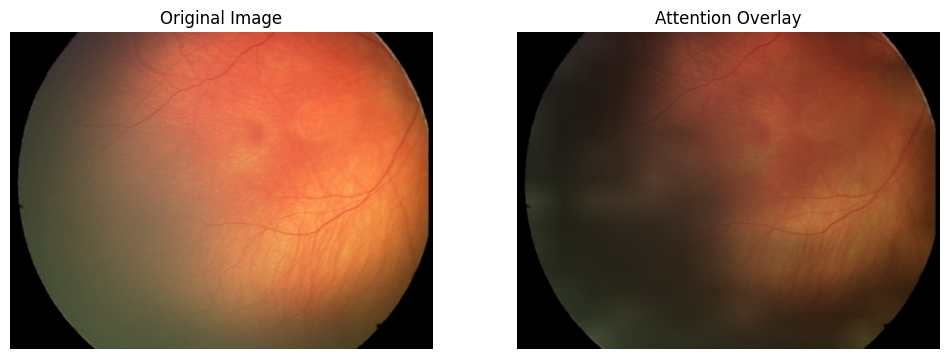

True Label: 1, Predicted Label: 0


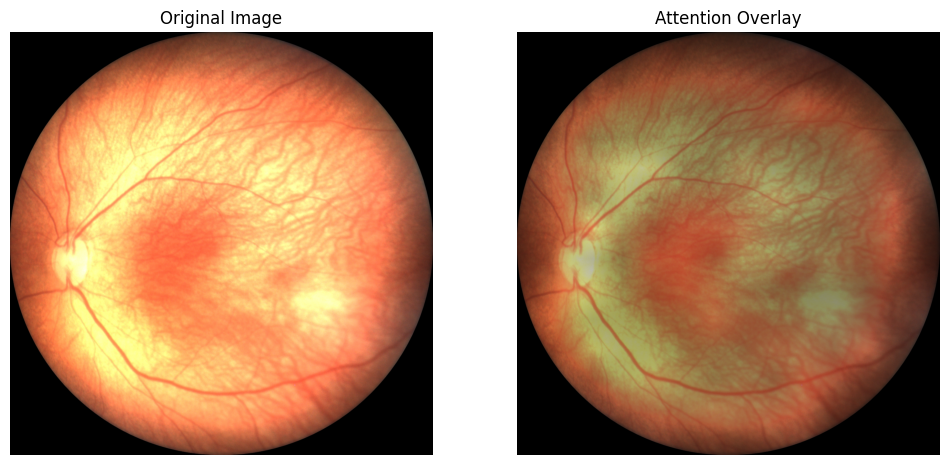

True Label: 1, Predicted Label: 0


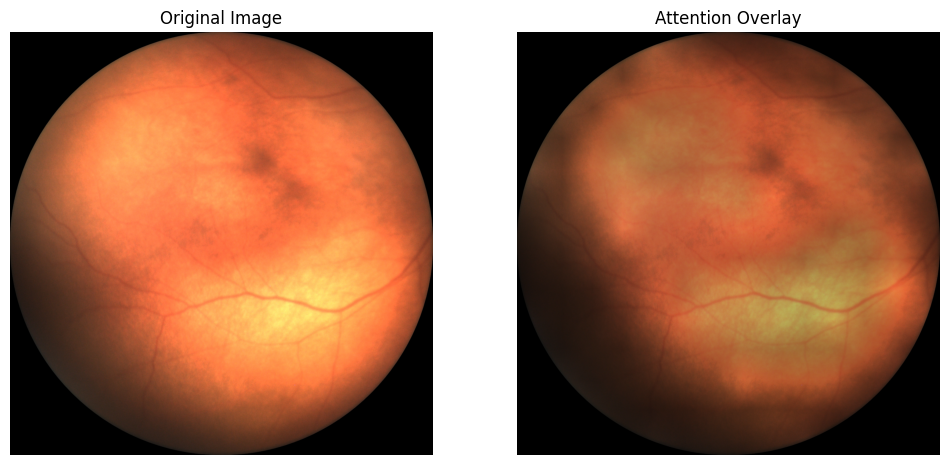

True Label: 1, Predicted Label: 0


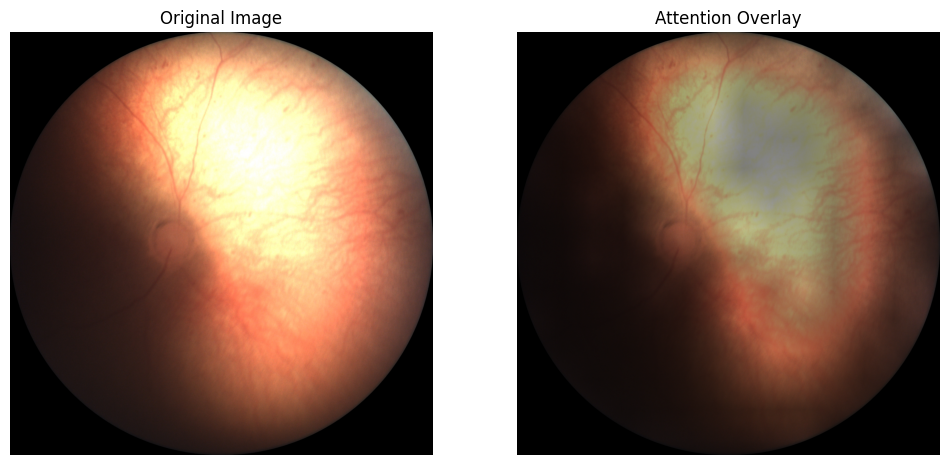

True Label: 1, Predicted Label: 0


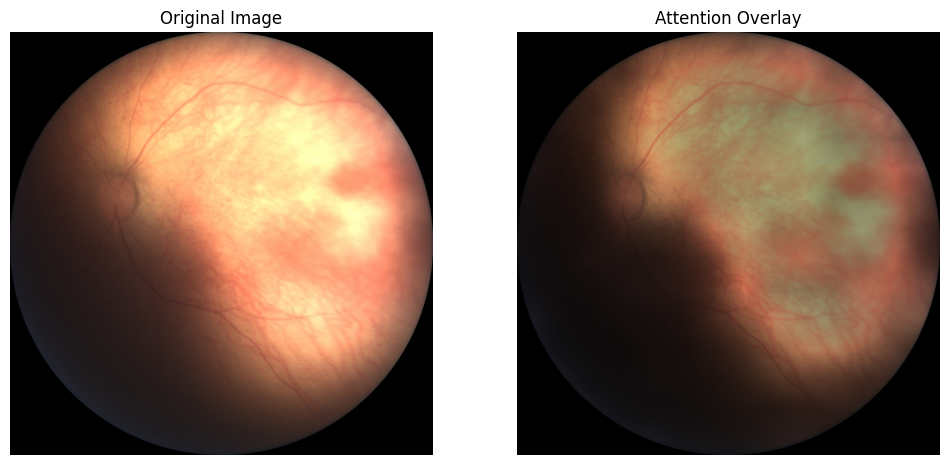

True Label: 1, Predicted Label: 0


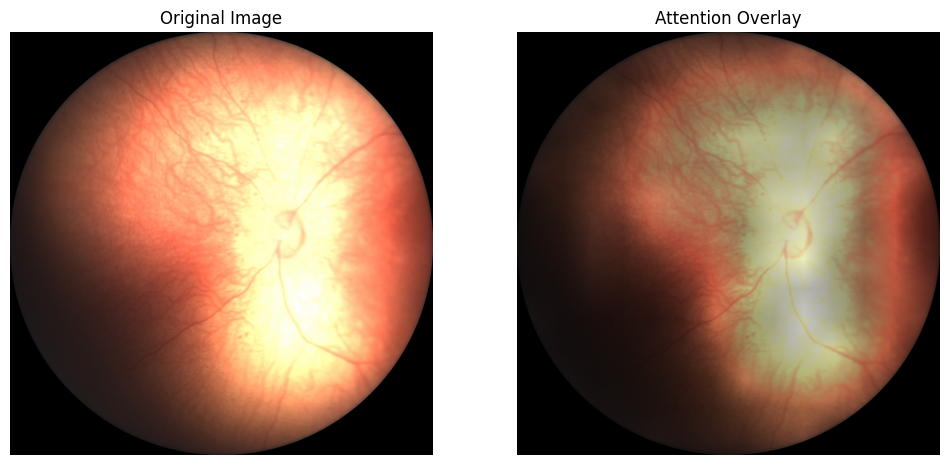

True Label: 1, Predicted Label: 0


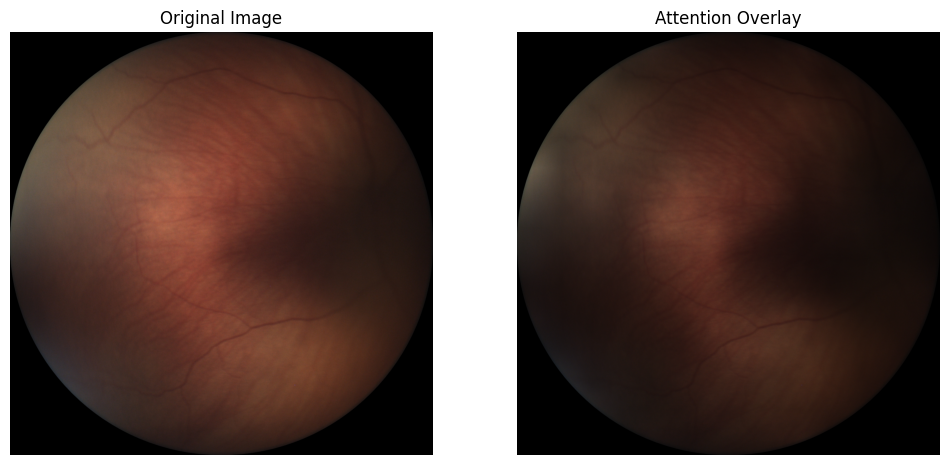

True Label: 1, Predicted Label: 0


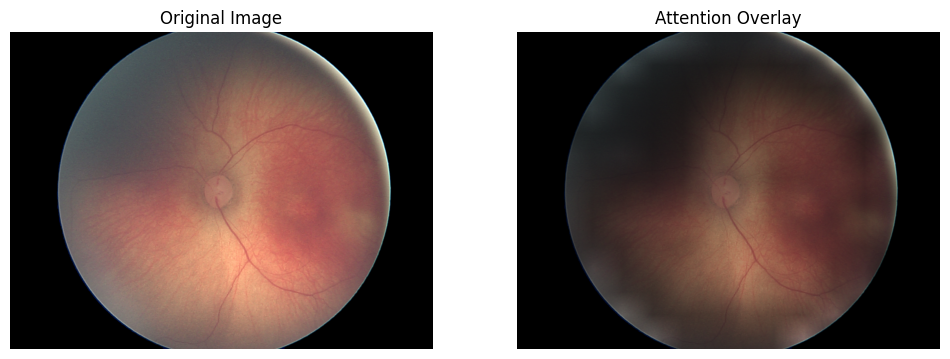

True Label: 1, Predicted Label: 0


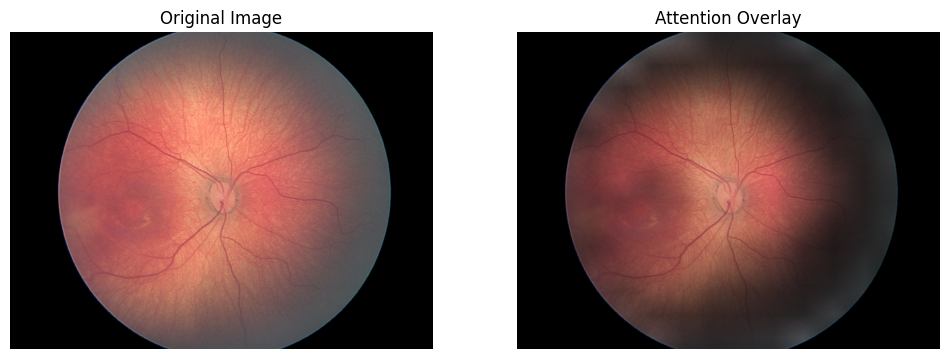

True Label: 1, Predicted Label: 0


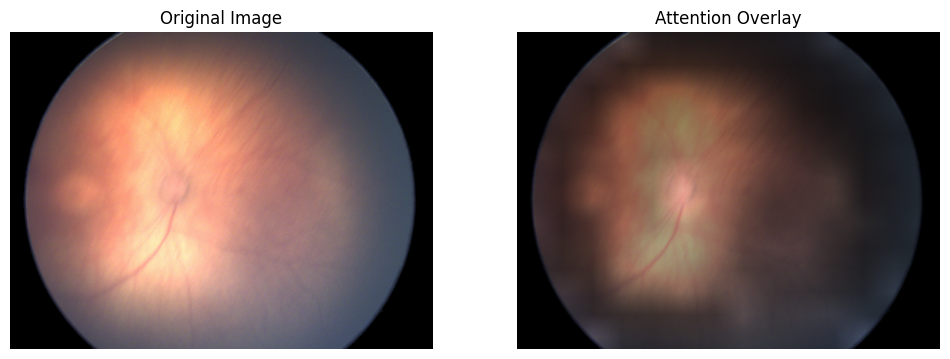

True Label: 1, Predicted Label: 0


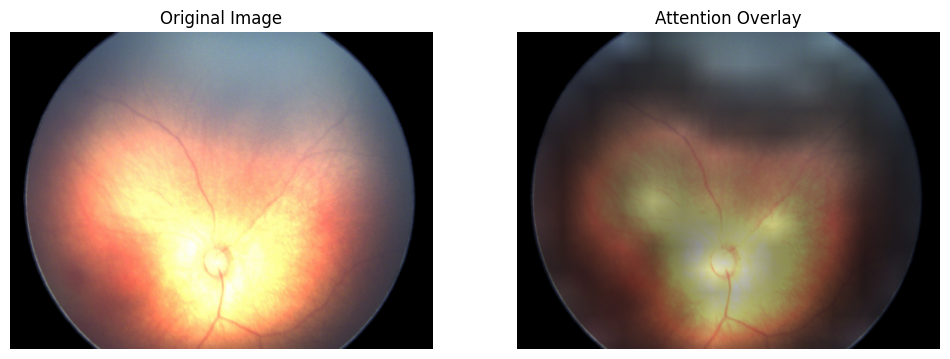

In [19]:
import cv2
def get_attention_image(image_path, model):
    """
    Получение изображения с наложенной матрицей внимания.

    Параметры:
    - image_path: Путь к изображению.
    - model: Предобученная модель с поддержкой внимания.

    Возвращает:
    - attention_overlay: Изображение с наложенной матрицей внимания.
    - original_image: Оригинальное изображение (PIL).
    """
    # Открытие и подготовка изображения
    image = Image.open(image_path).convert("RGB")
    transformed_image = test_transform(image).unsqueeze(0).to(DEVICE)

    # Перевод модели в режим оценки и получение внимания
    model.eval()
    with torch.no_grad():
        logits, att_mat = model(transformed_image, output_attentions=True)

    # Преобразование списка или кортежа в тензор
    if isinstance(att_mat, (tuple, list)):
        att_mat = torch.stack(att_mat).squeeze(1)
    else:
        att_mat = att_mat.squeeze(1)

    # Усреднение матрицы внимания
    att_mat = torch.mean(att_mat, dim=1)

    # Добавление остаточного внимания
    residual_att = torch.eye(att_mat.size(1)).to(DEVICE)
    aug_att_mat = att_mat + residual_att
    aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

    # Итоговая матрица внимания
    joint_attentions = torch.zeros(aug_att_mat.size()).to(DEVICE)
    joint_attentions[0] = aug_att_mat[0]

    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n - 1])

    # Финальная матрица внимания
    v = joint_attentions[-1]
    grid_size = int(np.sqrt(v.size(-1)))
    mask = v[0, 1:].reshape(grid_size, grid_size).cpu().detach().numpy()

    # Преобразование маски к размеру изображения
    mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]
    overlay = (mask * np.array(image)).astype("uint8")

    return overlay, image


errors = df_results[df_results['True Label'] != df_results['Predicted Label']]

for _, row in errors.iterrows():
    image_path = row['File Name']
    true_label = row['True Label']
    predicted_label = row['Predicted Label']

    print(f"True Label: {true_label}, Predicted Label: {predicted_label}")

    attention_overlay, original_image = get_attention_image(image_path, model)

    # Отображение
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(original_image)
    ax1.set_title("Original Image")
    ax1.axis("off")

    ax2.imshow(attention_overlay)
    ax2.set_title("Attention Overlay")
    ax2.axis("off")

    plt.show()


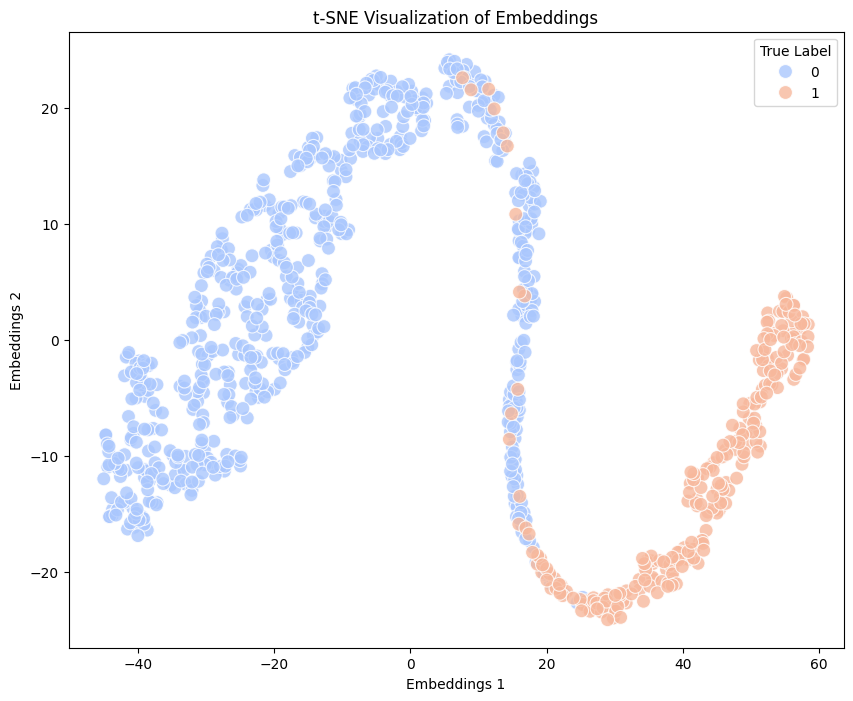

In [33]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch

def extract_embeddings(model, dataloader, device):
    """
    Извлечение эмбеддингов из модели для данных в dataloader.

    Параметры:
    - model: Обученная модель.
    - dataloader: DataLoader для тестового или валидационного набора данных.
    - device: Устройство, на котором работает модель (например, 'cuda' или 'cpu').

    Возвращает:
    - embeddings: Эмбеддинги для каждого изображения.
    - labels: Истинные метки классов для каждого изображения.
    """
    model.eval()  # Переводим модель в режим оценки
    embeddings = []
    labels = []

    with torch.no_grad():
        for inputs, target_labels, _ in dataloader:
            inputs = inputs.to(device)
            target_labels = target_labels.to(device)

            # Получаем эмбеддинги (извлекаем выход из модели)
            outputs = model(pixel_values=inputs)  # Передаем изображения через 'pixel_values'
            embeddings.append(outputs.cpu().numpy())  # Сохраняем эмбеддинги на CPU
            labels.extend(target_labels.cpu().numpy())  # Сохраняем метки

    embeddings = np.concatenate(embeddings, axis=0)  # Объединяем все эмбеддинги
    return embeddings, labels

def plot_embeddings_with_labels(embeddings, labels, method="t-SNE"):
    """
    Визуализация эмбеддингов с подсветкой классов с использованием t-SNE или PCA.

    Параметры:
    - embeddings: Эмбеддинги, которые нужно визуализировать.
    - labels: Истинные метки классов для каждого эмбеддинга.
    - method: Метод для уменьшения размерности ('t-SNE' или 'PCA').
    """
    # Применение метода снижения размерности
    if method == "t-SNE":
        reducer = TSNE(n_components=2, random_state=42)
    elif method == "PCA":
        reducer = PCA(n_components=2)

    reduced_embeddings = reducer.fit_transform(embeddings)

    # Формирование DataFrame для визуализации
    vis_df = pd.DataFrame({
        'Embeddings 1': reduced_embeddings[:, 0],
        'Embeddings 2': reduced_embeddings[:, 1],
        'True Label': labels
    })

    # Построение scatter plot
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
        data=vis_df,
        x='Embeddings 1', y='Embeddings 2',
        hue='True Label',
        palette='coolwarm',  # Цветовая палитра
        alpha=0.8,
        s=100
    )
    plt.title(f'{method} Visualization of Embeddings')
    plt.legend(title='True Label')
    plt.show()

# Пример использования:
# - model: Обученная модель
# - dataloader: DataLoader с тестовыми данными
# - device: Устройство, на котором работает модель ('cuda' или 'cpu')

# Шаг 1: Извлечение эмбеддингов
embeddings, labels = extract_embeddings(model, test_loader, DEVICE)

# Шаг 2: Визуализация эмбеддингов
plot_embeddings_with_labels(embeddings, labels, method="t-SNE")  # Используем t-SNE
